In [1]:
# Importing libraries
from __future__ import absolute_import, division, print_function, unicode_literals

import seaborn as sns

import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

import os
from datetime import datetime
from download import download

In [2]:
# Setting default fig size for better visualizations
mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [3]:
# Importing data
data = download('https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip', 
                '/tmp/aq', 
                kind='zip')

Replace is False and data exists, so doing nothing. Use replace=True to re-download the data.


In [4]:
# Creating a pandas a dataframe for Dingling data
ding = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', encoding='ISO-8859-1')

In [5]:
# Lets look at the data
ding.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


Data for different parameters is acquired everyhour!
PM2.5 is the variable we are going to emphasis in this study as the risks due to PM2.5 are very high.

In [6]:
# Combining 4 columns year, month, day, hour to date
def convert_to_date(x):
    return datetime.strptime(x, '%Y %m %d %H')

In [7]:
# Dingling data with date
ding_wd = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', 
                      parse_dates=[['year', 'month', 'day', 'hour']], 
                      date_parser=convert_to_date, 
                      keep_date_col=True)

In [8]:
# Lets look at the data
ding_wd.head()

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [9]:
# Converting month to num type
ding_wd['month'] = pd.to_numeric(ding_wd['month'])

In [10]:
ProfileReport(ding_wd, title='Pandas Profiling Report')

C:\Users\JadhavJa\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas_profiling\model\correlations.py:35: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min((kcorr - 1.0), (rcorr - 1.0)))


In [11]:
# Creating a copy
ding_wd_non_indexed = ding_wd.copy()

In [12]:
# Set date as index
ding_wd = ding_wd.set_index('year_month_day_hour')

In [13]:
ding_wd.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [14]:
# PM2.5 data
pm_data = ding_wd['PM2.5']
pm_data.head()

year_month_day_hour
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    7.0
2013-03-01 02:00:00    5.0
2013-03-01 03:00:00    6.0
2013-03-01 04:00:00    5.0
Name: PM2.5, dtype: float64

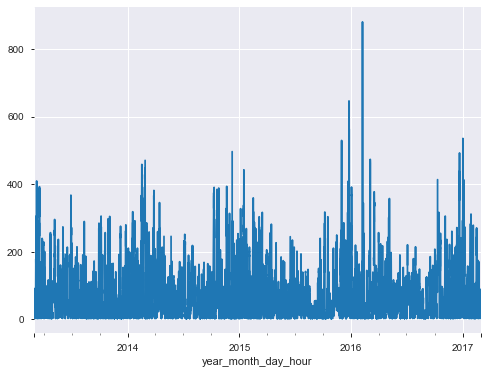

In [15]:
pm_data.plot(grid=True)

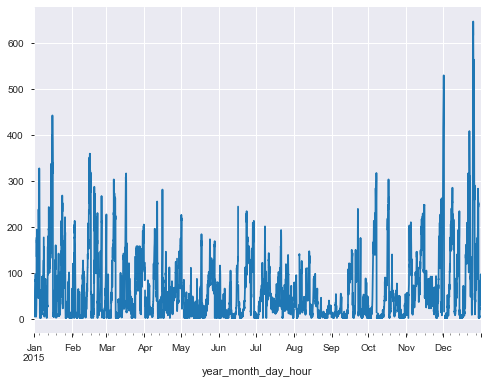

In [16]:
# PM2.5 data for 2015
pm_2015 = pm_data.loc['2015']
pm_2015.plot(grid=True)

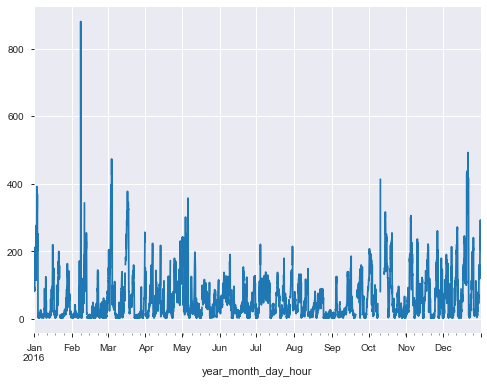

In [17]:
# PM2.5 data for 2016
pm_2016 = pm_data.loc['2016']
pm_2016.plot(grid=True)

Comparison of PM2.5 data for 2015 and 2016 shows some seasonality. 

In [18]:
# Trying Plotly Express
import plotly.express as px
fig = px.line(ding_wd_non_indexed, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [19]:
fig = px.line(ding_wd_non_indexed, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider and Buttons')

fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([dict(count=1, label='1y', step='year', stepmode='backward'), 
                                                  dict(count=2, label='2y', step='year', stepmode='backward'), 
                                                  dict(count=3, label='3y', step='year', stepmode='backward'), 
                                                  dict(step='all')])))
fig.show()

Text(0.5, 1.0, 'PM2.5 for 2014 and 2015')

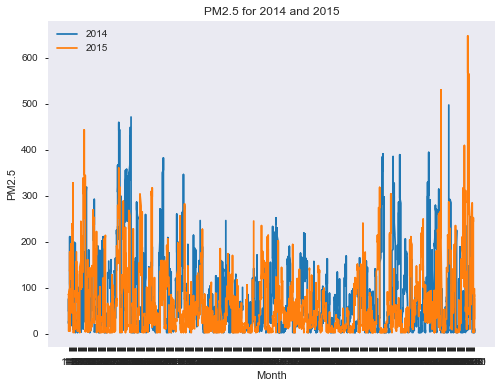

In [20]:
# Overlaying time-frames
ding_2014 = ding_wd['2014'].reset_index()
ding_2015 = ding_wd['2015'].reset_index()

ding_2014['month_day_hour'] = ding_2014.apply(lambda x: str(x['month'])+"-"+x['day'], axis=1)
ding_2015['month_day_hour'] = ding_2015.apply(lambda x: str(x['month'])+"-"+x['day'], axis=1)

plt.plot(ding_2014['month_day_hour'], ding_2014['PM2.5'])
plt.plot(ding_2015['month_day_hour'], ding_2015['PM2.5'])

plt.legend(['2014', '2015'])
plt.xlabel('Month')
plt.ylabel('PM2.5')
plt.title('PM2.5 for 2014 and 2015')

In [21]:
# Grouping data by month
ding_wd['2014':'2016'][['month','PM2.5']].groupby('month').describe()

PM2.5                                                       
        count       mean         std  min   25%   50%     75%    max
month                                                               
1      2173.0  70.285274   75.913587  3.0  12.0  38.0  113.00  443.0
2      1978.0  86.389282  105.603069  3.0  10.0  33.0  132.00  881.0
3      2212.0  80.193852   87.889440  3.0  13.0  47.0  123.25  474.0
4      2105.0  67.963325   56.430235  3.0  25.0  54.0   95.00  346.0
5      2188.0  47.994378   44.843130  3.0  16.0  35.0   67.00  358.0
6      2119.0  46.655403   43.877349  3.0  13.0  31.0   69.00  245.0
7      2205.0  61.671474   50.926149  3.0  21.0  48.0   91.00  252.0
8      2206.0  41.364869   37.279312  3.0  13.0  29.0   60.00  217.0
9      2074.0  45.356123   43.235331  3.0  11.0  27.0   78.00  240.0
10     2081.0  82.586257   92.234361  3.0  13.0  43.0  124.00  414.0
11     2141.0  77.500140   71.720648  3.0  20.0  56.0  112.00  394.0
12     2186.0  87.990851  104.677021  3.0  11.0  48.5  135.00  647.0

In [22]:
# With Temperature
ding_wd['2014':'2016'][['month','PM2.5', 'TEMP']].groupby('month').agg({'PM2.5':['min','max'],'TEMP':['min','max']})

PM2.5         TEMP      
        min    max   min   max
month                         
1       3.0  443.0 -16.6  12.4
2       3.0  881.0 -10.9  14.0
3       3.0  474.0  -6.4  26.0
4       3.0  346.0   1.3  32.0
5       3.0  358.0   7.0  41.4
6       3.0  245.0  15.1  38.1
7       3.0  252.0  16.8  39.2
8       3.0  217.0  16.6  36.3
9       3.0  240.0   7.8  34.5
10      3.0  414.0  -1.4  28.1
11      3.0  394.0 -10.3  20.8
12      3.0  647.0  -9.7  11.6

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000020C80A00548>,
      dtype=object)

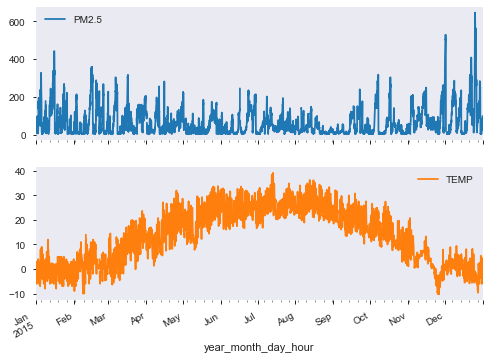

In [23]:
ding_wd_2015 = ding_wd['2015']
pm_data_2015 = ding_wd_2015[['PM2.5','TEMP']]
pm_data_2015.plot(subplots = True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000020C83A255C8>,
      dtype=object)

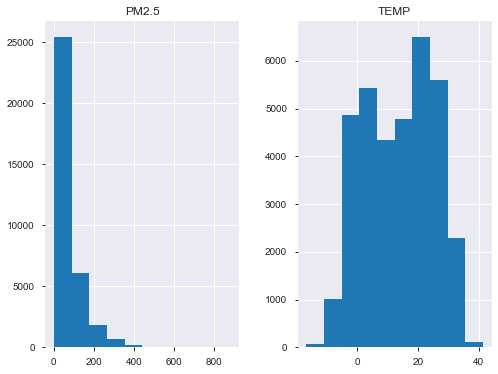

In [24]:
# Histogram
ding_wd[['PM2.5','TEMP']].hist()

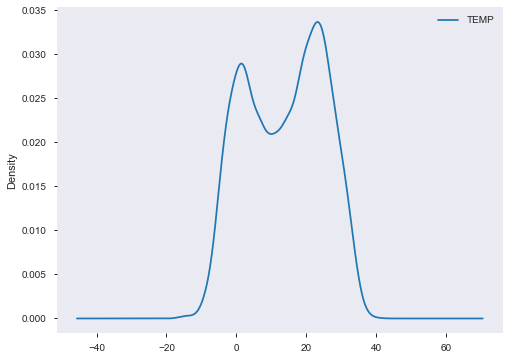

In [25]:
# Kernel Density Plot
ding_wd[['TEMP']].plot(kind='density')

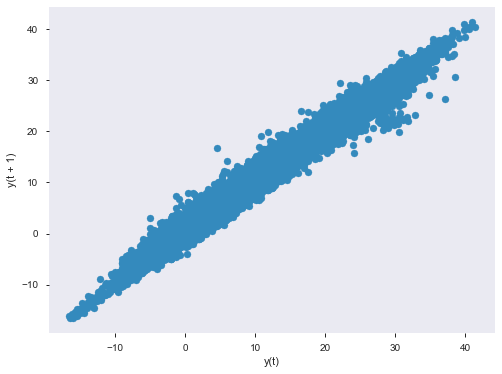

In [26]:
# Lag Plot with 1 hour lag
pd.plotting.lag_plot(ding_wd['TEMP'], lag=1)

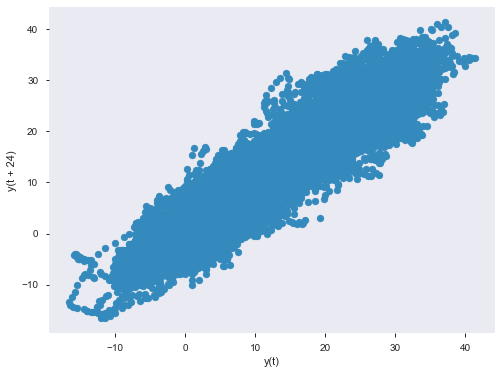

In [27]:
# Lag Plot with 1 day lag
pd.plotting.lag_plot(ding_wd['TEMP'], lag=24)

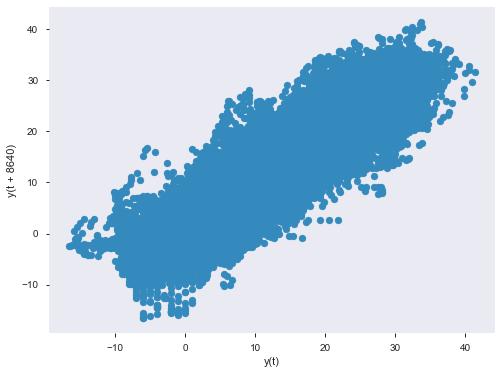

In [28]:
# Lag Plot with 1 year lag
pd.plotting.lag_plot(ding_wd['TEMP'], lag=8640)

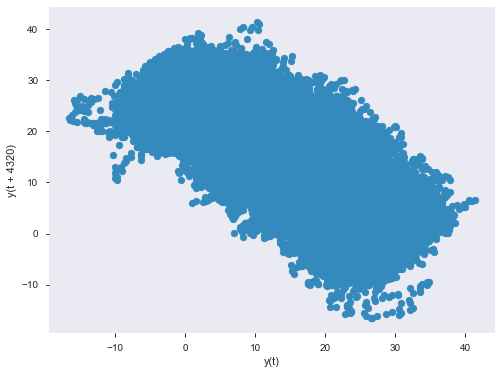

In [29]:
# Lag Plot with 6 months lag
pd.plotting.lag_plot(ding_wd['TEMP'], lag=4320)
# Negative correlation

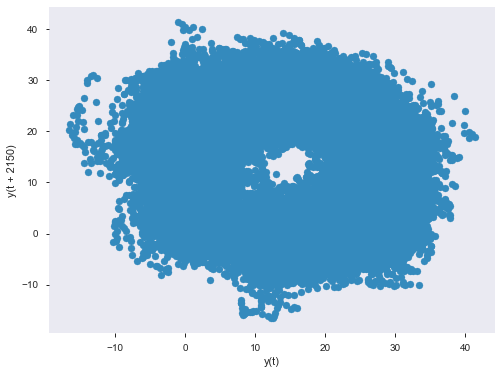

In [30]:
# Lag Plot with 3 months lag
pd.plotting.lag_plot(ding_wd['TEMP'], lag=2150)
# No correlation

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000020C8272B9C8>,
      dtype=object)

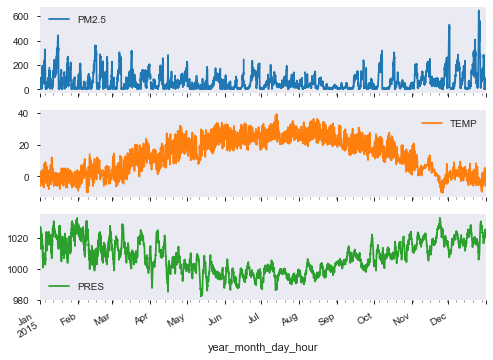

In [31]:
# Including Pressure data
pm_data_2015 = ding_wd_2015[['PM2.5','TEMP', 'PRES']]
pm_data_2015.plot(subplots = True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000020C807A5888>,
      dtype=object)

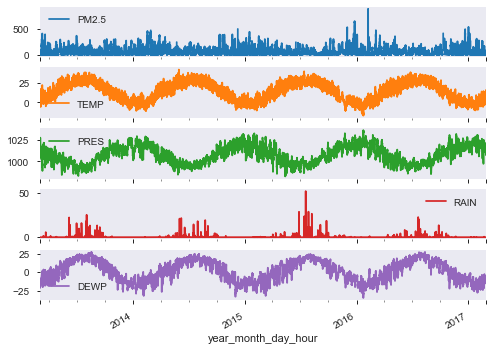

In [32]:
# More features
multi_data = ding_wd[['PM2.5','TEMP','PRES','RAIN','DEWP']]
multi_data.plot(subplots = True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000020C8079F848>,
      dtype=object)

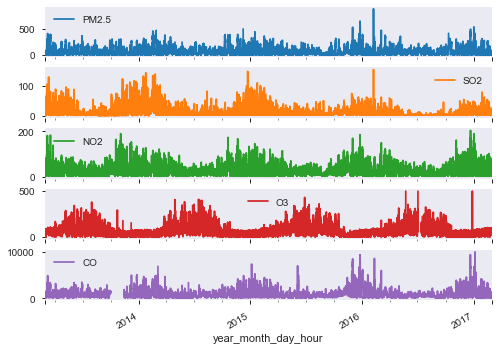

In [33]:
multi_data = ding_wd[['PM2.5','SO2','NO2','O3','CO']]
multi_data.plot(subplots = True)

Text(0.5, 0, 'year_month_day_hour')

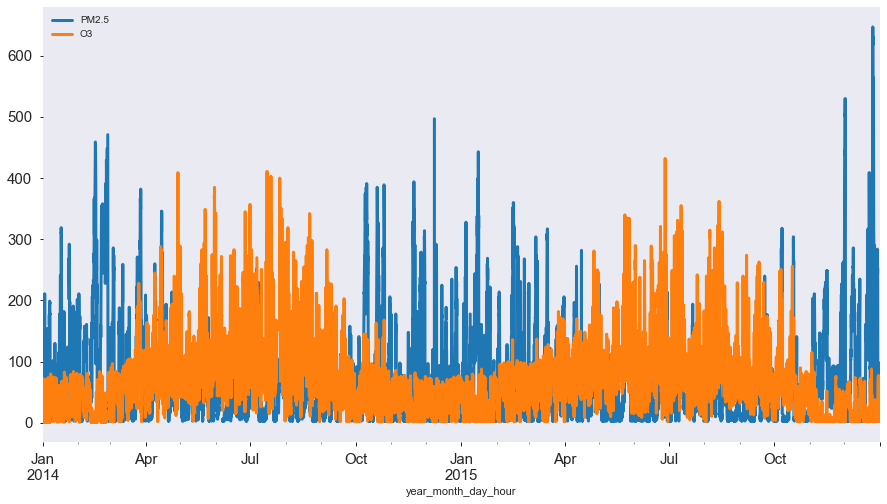

In [34]:
ding_wd['2014':'2015'][['PM2.5','O3']].plot(figsize=(15,8),linewidth= 3,fontsize = 15)
plt.xlabel('year_month_day_hour')

Correlation between PM2.5 and other features becomes very clear through different visualizations.

In [35]:
# Handling null values
ding_wd_2015['PM2.5']

year_month_day_hour
2015-01-01 00:00:00     NaN
2015-01-01 01:00:00     NaN
2015-01-01 02:00:00     NaN
2015-01-01 03:00:00     NaN
2015-01-01 04:00:00     NaN
                       ... 
2015-12-31 19:00:00    85.0
2015-12-31 20:00:00     NaN
2015-12-31 21:00:00    80.0
2015-12-31 22:00:00    93.0
2015-12-31 23:00:00    98.0
Name: PM2.5, Length: 8760, dtype: float64

In [36]:
ding_wd_2015

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,16105,2015,1,1,0,NaN,NaN,NaN,NaN,NaN,NaN,-4.0,1025.0,-23.7,0.0,NW,3.3,Dingling
2015-01-01 01:00:00,16106,2015,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,1022.0,-22.6,0.0,NNE,1.2,Dingling
2015-01-01 02:00:00,16107,2015,1,1,2,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,1022.0,-23.5,0.0,NNW,1.7,Dingling
2015-01-01 03:00:00,16108,2015,1,1,3,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,1023.0,-23.5,0.0,N,1.7,Dingling
2015-01-01 04:00:00,16109,2015,1,1,4,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,1024.0,-24.0,0.0,NE,1.8,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,24860,2015,12,31,19,85.0,95.0,12.0,73.0,1200.0,2.0,-0.6,1021.0,-9.5,0.0,NE,0.6,Dingling
2015-12-31 20:00:00,24861,2015,12,31,20,NaN,109.0,32.0,79.0,2900.0,2.0,-1.8,1021.2,-9.9,0.0,NW,1.1,Dingling
2015-12-31 21:00:00,24862,2015,12,31,21,80.0,100.0,35.0,81.0,3200.0,2.0,-1.6,1020.8,-9.7,0.0,NE,0.9,Dingling


In [37]:
ding_wd.isnull().sum()

No            0
year          0
month         0
day           0
hour          0
PM2.5       779
PM10        656
SO2         730
NO2        1234
CO         2012
O3         1214
TEMP         53
PRES         50
DEWP         53
RAIN         51
wd          140
WSPM         43
station       0
dtype: int64

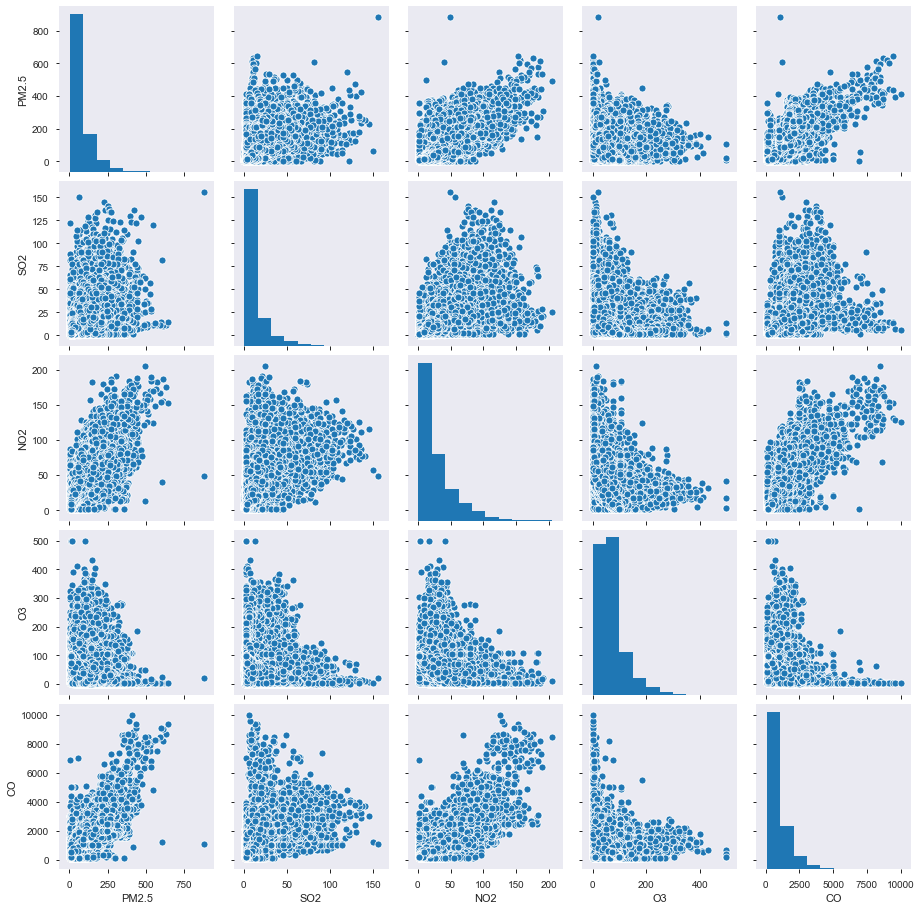

In [38]:
g = sns.pairplot(ding_wd[['PM2.5','SO2','NO2','O3','CO']])

In [39]:
p_corr = ding_wd[['PM2.5','SO2','NO2','O3','CO']].corr(method = 'pearson')
p_corr

,PM2.5,SO2,NO2,O3,CO
PM2.5,1.000000,0.475117,0.718170,-0.100542,0.802737
SO2,0.475117,1.000000,0.610433,-0.182096,0.529182
NO2,0.718170,0.610433,1.000000,-0.373625,0.798753
O3,-0.100542,-0.182096,-0.373625,1.000000,-0.303275
CO,0.802737,0.529182,0.798753,-0.303275,1.000000


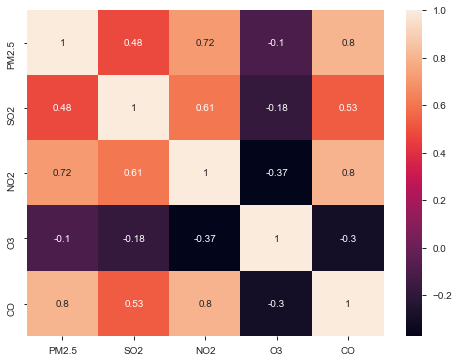

In [40]:
sns.heatmap(p_corr,annot=True)

In [41]:
# Wind Direction data
ding_wd.groupby('wd').agg(median=('PM2.5','median'),mean=('PM2.5','mean'),max=('PM2.5','max'),min=('PM2.5','min')).reset_index()

,wd,median,mean,max,min
0,E,70.0,88.623363,434.0,3.0
1,ENE,56.5,77.685514,647.0,3.0
2,ESE,78.5,96.492276,632.0,3.0
3,N,29.0,57.546221,536.0,3.0
4,NE,32.0,57.390083,530.0,3.0
5,NNE,26.0,53.946239,881.0,3.0
6,NNW,33.0,62.790775,548.0,3.0
7,NW,21.0,52.769116,535.0,3.0
8,S,52.0,72.497281,511.0,3.0
9,SE,70.0,85.045709,617.0,3.0


In [42]:
# Auto-correlation plot
ding_wd_na = ding_wd.copy()
ding_wd_na = ding_wd_na.dropna()

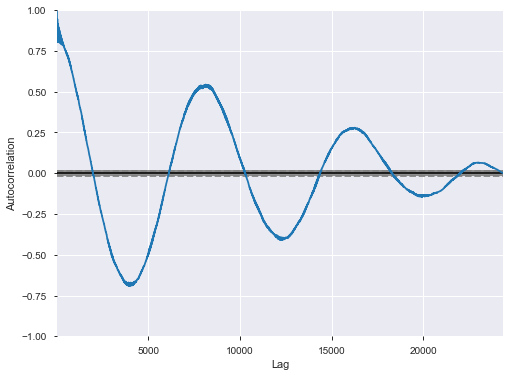

In [43]:
pd.plotting.autocorrelation_plot(ding_wd_na['2014':'2016']['TEMP'])

In [44]:
ding_wd_na['TEMP'].resample('1m').mean()

year_month_day_hour
2013-03-31     6.039970
2013-04-30    12.208494
2013-05-31    21.886386
2013-06-30    23.752827
2013-07-31    27.405079
2013-08-31    27.228465
2013-09-30    20.482500
2013-10-31          NaN
2013-11-30     5.434524
2013-12-31     0.896623
2014-01-31     0.023428
2014-02-28    -0.352762
2014-03-31    10.415449
2014-04-30    17.235362
2014-05-31    22.043236
2014-06-30    25.194985
2014-07-31    28.409502
2014-08-31    26.284552
2014-09-30    20.834161
2014-10-31    13.556000
2014-11-30     6.357762
2014-12-31    -0.745582
2015-01-31    -0.590377
2015-02-28     1.572512
2015-03-31     8.707613
2015-04-30    15.566570
2015-05-31    21.300275
2015-06-30    24.636691
2015-07-31    26.228630
2015-08-31    26.135854
2015-09-30    20.392206
2015-10-31    14.387465
2015-11-30     3.358686
2015-12-31    -0.053912
2016-01-31    -4.233428
2016-02-29     1.434441
2016-03-31     8.687006
2016-04-30    16.262014
2016-05-31    20.793142
2016-06-30    25.481977
2016-07-31    25.839

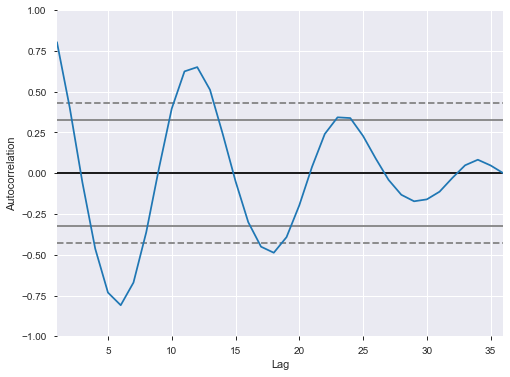

In [45]:
pd.plotting.autocorrelation_plot(ding_wd_na['2014':'2016']['TEMP'].resample('1m').mean())

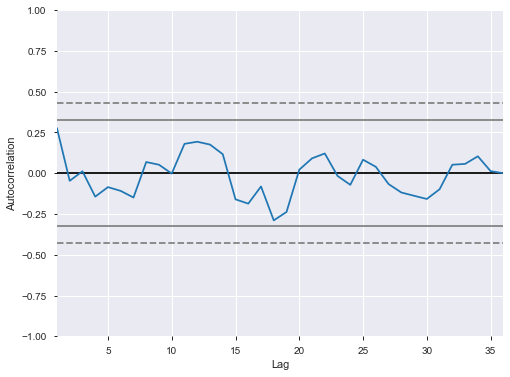

In [46]:
pd.plotting.autocorrelation_plot(ding_wd_na['2014':'2016']['PM2.5'].resample('1m').mean())

Autocorrelation plot for temperature shows good autocorrelation strength with seasonality of 1 year. There is some seasonality visible in the PM2.5 autocorrelation plot but not as strong as temperature. 

### Handling Missing Values

In [47]:
ding_wd.isnull().sum()

No            0
year          0
month         0
day           0
hour          0
PM2.5       779
PM10        656
SO2         730
NO2        1234
CO         2012
O3         1214
TEMP         53
PRES         50
DEWP         53
RAIN         51
wd          140
WSPM         43
station       0
dtype: int64

In [48]:
# Lets work with Temperature
ding_wd.query('TEMP != TEMP')

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2015-01-27 20:00:00,16749,2015,1,27,20,39.0,43.0,28.0,34.0,1100.0,23.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-01-30 13:00:00,16814,2015,1,30,13,15.0,19.0,19.0,5.0,400.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-01-31 05:00:00,16830,2015,1,31,5,5.0,11.0,32.0,8.0,400.0,60.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-02 01:00:00,16874,2015,2,2,1,60.0,60.0,30.0,39.0,2600.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-02 11:00:00,16884,2015,2,2,11,138.0,138.0,52.0,73.0,2200.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-04 10:00:00,16931,2015,2,4,10,8.0,8.0,13.0,5.0,200.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-04 13:00:00,16934,2015,2,4,13,13.0,16.0,14.0,3.0,300.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-07 15:00:00,17008,2015,2,7,15,3.0,24.0,2.0,2.0,200.0,88.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-08 14:00:00,17031,2015,2,8,14,4.0,5.0,7.0,2.0,200.0,80.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling


In [49]:
# Columns that DONT have null values
ding_wd.query('TEMP != TEMP').count()

No         53
year       53
month      53
day        53
hour       53
PM2.5      53
PM10       53
SO2        53
NO2        53
CO         53
O3         53
TEMP        0
PRES        3
DEWP        0
RAIN        3
wd         10
WSPM       10
station    53
dtype: int64

In [50]:
# PM2.5 Null Data
ding_wd[ding_wd['PM2.5'].isnull()]

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-04-01 08:00:00,753,2013,4,1,8,NaN,NaN,NaN,NaN,NaN,NaN,11.0,1005.9,-3.2,0.0,NW,7.2,Dingling
2013-04-01 09:00:00,754,2013,4,1,9,NaN,NaN,NaN,NaN,NaN,NaN,10.6,1007.0,-3.5,0.0,NNW,4.5,Dingling
2013-04-01 10:00:00,755,2013,4,1,10,NaN,NaN,NaN,NaN,NaN,NaN,13.2,1007.8,-3.6,0.0,NNW,4.5,Dingling
2013-04-01 11:00:00,756,2013,4,1,11,NaN,NaN,NaN,NaN,NaN,NaN,13.8,1007.7,-4.9,0.0,NNE,4.0,Dingling
2013-04-01 12:00:00,757,2013,4,1,12,NaN,NaN,NaN,NaN,NaN,NaN,15.3,1007.9,-5.7,0.0,NE,5.0,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-20 15:00:00,34864,2017,2,20,15,NaN,NaN,NaN,NaN,NaN,NaN,4.2,1022.0,-21.0,0.0,WNW,3.1,Dingling
2017-02-20 16:00:00,34865,2017,2,20,16,NaN,NaN,NaN,NaN,NaN,NaN,4.4,1022.1,-21.7,0.0,WNW,3.4,Dingling
2017-02-20 18:00:00,34867,2017,2,20,18,NaN,NaN,NaN,NaN,NaN,NaN,3.3,1022.2,-20.9,0.0,NE,1.1,Dingling


In [51]:
fig = px.line(ding_wd_non_indexed, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider and Buttons')

fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([dict(count=1, label='1y', step='year', stepmode='backward'), 
                                                  dict(count=2, label='2y', step='year', stepmode='backward'), 
                                                  dict(count=3, label='3y', step='year', stepmode='backward'), 
                                                  dict(step='all')])))
fig.show()

In [52]:
fig = px.line(ding_wd_non_indexed, x='year_month_day_hour', y='TEMP', title='TEMP with Slider and Buttons')

fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([dict(count=1, label='1y', step='year', stepmode='backward'), 
                                                  dict(count=2, label='2y', step='year', stepmode='backward'), 
                                                  dict(count=3, label='3y', step='year', stepmode='backward'), 
                                                  dict(step='all')])))
fig.show()

In [53]:
ding_wd['2015-02-21 10':'2015-02-21 20']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling
2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling
2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling
2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling
2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling
2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling
2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling


In [54]:
# Data to impute
ding_imp = ding_wd['2015-02-21 10':'2015-02-21 20'][['TEMP']]
ding_imp

,TEMP
year_month_day_hour,
2015-02-21 10:00:00,1.0
2015-02-21 11:00:00,1.0
2015-02-21 12:00:00,NaN
2015-02-21 13:00:00,2.0
2015-02-21 14:00:00,NaN
2015-02-21 15:00:00,4.0
2015-02-21 16:00:00,4.0
2015-02-21 17:00:00,3.0
2015-02-21 18:00:00,2.0


In [55]:
# Forward Fill
ding_imp['TEMP_FFILL'] = ding_imp['TEMP'].fillna(method='ffill')
ding_imp

,TEMP,TEMP_FFILL
year_month_day_hour,,
2015-02-21 10:00:00,1.0,1.0
2015-02-21 11:00:00,1.0,1.0
2015-02-21 12:00:00,NaN,1.0
2015-02-21 13:00:00,2.0,2.0
2015-02-21 14:00:00,NaN,2.0
2015-02-21 15:00:00,4.0,4.0
2015-02-21 16:00:00,4.0,4.0
2015-02-21 17:00:00,3.0,3.0
2015-02-21 18:00:00,2.0,2.0


In [56]:
# Backward Fill - Not the best here as we may not know future value
ding_imp['TEMP_BFILL'] = ding_imp['TEMP'].fillna(method='bfill')
ding_imp

,TEMP,TEMP_FFILL,TEMP_BFILL
year_month_day_hour,,,
2015-02-21 10:00:00,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,1.0,2.0
2015-02-21 13:00:00,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,2.0,4.0
2015-02-21 15:00:00,4.0,4.0,4.0
2015-02-21 16:00:00,4.0,4.0,4.0
2015-02-21 17:00:00,3.0,3.0,3.0
2015-02-21 18:00:00,2.0,2.0,2.0


In [57]:
# Fill with mean of previous 2 values
ding_imp['TEMP_ROLLING'] = ding_imp['TEMP'].rolling(window=2, min_periods=1).mean()
ding_imp

,TEMP,TEMP_FFILL,TEMP_BFILL,TEMP_ROLLING
year_month_day_hour,,,,
2015-02-21 10:00:00,1.0,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,1.0,2.0,1.0
2015-02-21 13:00:00,2.0,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,2.0,4.0,2.0
2015-02-21 15:00:00,4.0,4.0,4.0,4.0
2015-02-21 16:00:00,4.0,4.0,4.0,4.0
2015-02-21 17:00:00,3.0,3.0,3.0,3.5
2015-02-21 18:00:00,2.0,2.0,2.0,2.5


In [58]:
# ding_imp['TEMP'].fillna(ding_imp['TEMP_ROLLING'], inplace=True)
# ding_imp

In [59]:
# Imputing special cases - by year
ding_wd.loc[ding_imp.index + pd.offsets.DateOffset(years=-1)]['TEMP']

year_month_day_hour
2014-02-21 10:00:00    1.4
2014-02-21 11:00:00    2.4
2014-02-21 12:00:00    3.0
2014-02-21 13:00:00    3.8
2014-02-21 14:00:00    3.5
2014-02-21 15:00:00    3.6
2014-02-21 16:00:00    3.3
2014-02-21 17:00:00    2.8
2014-02-21 18:00:00    1.3
2014-02-21 19:00:00    0.7
2014-02-21 20:00:00    1.2
Freq: H, Name: TEMP, dtype: float64

In [60]:
ding_imp = ding_imp.reset_index()
ding_imp

,year_month_day_hour,TEMP,TEMP_FFILL,TEMP_BFILL,TEMP_ROLLING
0,2015-02-21 10:00:00,1.0,1.0,1.0,1.0
1,2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2,2015-02-21 12:00:00,NaN,1.0,2.0,1.0
3,2015-02-21 13:00:00,2.0,2.0,2.0,2.0
4,2015-02-21 14:00:00,NaN,2.0,4.0,2.0
5,2015-02-21 15:00:00,4.0,4.0,4.0,4.0
6,2015-02-21 16:00:00,4.0,4.0,4.0,4.0
7,2015-02-21 17:00:00,3.0,3.0,3.0,3.5
8,2015-02-21 18:00:00,2.0,2.0,2.0,2.5
9,2015-02-21 19:00:00,1.0,1.0,1.0,1.5


In [61]:
ding_imp['TEMP_PRE_YR'] = ding_imp.apply(lambda x: ding_wd.loc[x['year_month_day_hour'] - pd.offsets.DateOffset(years=1)]['TEMP'] if pd.isna(x['TEMP']) else x['TEMP'], axis=1)

In [62]:
ding_imp

,year_month_day_hour,TEMP,TEMP_FFILL,TEMP_BFILL,TEMP_ROLLING,TEMP_PRE_YR
0,2015-02-21 10:00:00,1.0,1.0,1.0,1.0,1.0
1,2015-02-21 11:00:00,1.0,1.0,1.0,1.0,1.0
2,2015-02-21 12:00:00,NaN,1.0,2.0,1.0,3.0
3,2015-02-21 13:00:00,2.0,2.0,2.0,2.0,2.0
4,2015-02-21 14:00:00,NaN,2.0,4.0,2.0,3.5
5,2015-02-21 15:00:00,4.0,4.0,4.0,4.0,4.0
6,2015-02-21 16:00:00,4.0,4.0,4.0,4.0,4.0
7,2015-02-21 17:00:00,3.0,3.0,3.0,3.5,3.0
8,2015-02-21 18:00:00,2.0,2.0,2.0,2.5,2.0
9,2015-02-21 19:00:00,1.0,1.0,1.0,1.5,1.0


In [63]:
# ding_imp['TEMP'].fillna(ding_imp['TEMP_PRE_YR'], inplace=True)
# ding_imp

Different strategies for handling missing values - forward fill, backward fill, average of previous n values and fill from last year were implemented. A mix of multiple imputations is also possible based on the requirements of the data and the problem.